In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import networkx as nx
from ipywidgets import interact
import pandas as pd
import itertools

from bokeh.io import show, output_notebook
from bokeh.plotting import figure

output_notebook()

In /home/spaceape/anaconda3/envs/graphs/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The savefig.frameon rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.
In /home/spaceape/anaconda3/envs/graphs/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The verbose.level rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.
In /home/spaceape/anaconda3/envs/graphs/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle: 
The verbose.fileo rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.


Loading BokehJS ...

## Prepare the data

In [13]:
# Load initial pages with 1st related
df1 = pd.read_csv('data/data1.csv',
                 sep=';',
                 header=None)

In [14]:
df1.head(2)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,cfact,HeartlandInstitute,MattKibbe,wattsupwiththat-133662869999306,Energy.Citizens,Reason.Magazine,justrealfacts,FoSClimateEd,The-Galileo-Movement-101728306584541,DavidAustinFrench,MercatorNet,CFACTCampus,marklevinshow,isthereglobalcooling,TheNewAmerican,hatingbreitbart,AmericanThinker,humaneventsmedia,IMConservative
1,iloveco2,inconvenientfacts.xyz,theGWPF,The-Galileo-Movement-101728306584541,thegrandsolarmini,wattsupwiththat-133662869999306,wwpagws,GunCultureWorld,ClimateHomeNews,LordMonckton,TheGeneralConsensus,iHeartClimateScientists,Armstrongecon,thepursuitofenergy,FoSClimateEd,TheLastAmericanVagabond,Michael-Roberts-blog-925340197491022,TheNewAmerican,R2ANM


In [15]:
# Load 1st related wih 2nd related
df2 = pd.read_csv('data/data2-uniq.csv',
                 sep=';',
                 header=None)

In [16]:
df2.head(2)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,350.org,ExtinctionRebellion,WWF,CitizensClimateLobby,unionofconcernedscientists,greenpeaceusa,climatepower2020,EcoWatch,grist.org,nrdc.org,iucn.org,EnvDefenseFund,Earthjustice,Climate-Awareness-Network-325073881246240,auroraborealisobservatory,dontdrill,callforclimate,republicen,WorldWarZeroOrg
1,AboveClimateChange,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Create list of unique pages / nodes and page2id dict
uniq = []
for i, r in df1.iterrows():
    uniq.append(list(r))
    
for i, r in df2.iterrows():
    uniq.append(list(r))
    
uniq_pages = sorted([i for i in list(set(itertools.chain.from_iterable(uniq))) if isinstance(i, str)])
print(f"{len(uniq_pages)} nodes in total\n{uniq_pages}")

In [18]:
# Create list of init pages and related_1 pages
initial = list(df1[0])
related_1 = list(df2[0])

In [96]:
page2id = {name: i for i, name in enumerate(uniq_pages)}

## Load only manualy classified data

In [217]:
def strip_link(x):
    if  '/' in x:
        return x.split('/')[-1]
    else:
        return x

In [218]:
df = pd.read_csv('data/stranky_klasifikace-labeled_to_josef.csv',
                 sep=',')

In [219]:
# df.Label.replace('poz', 1, inplace=True)
# df.Label.replace('neg', 0, inplace=True)
df = df[(df.Label == 'poz') | (df.Label == 'neg')]
df.Page = df.Page.apply(strip_link)
df.drop_duplicates(subset=['Page'], inplace=True)
df.reset_index(drop=True, inplace=True)

In [220]:
df.head(5)

,Page,Label
0,Climate-ChangeGlobal-Warming-324905208198057,poz
1,Disinformation-Directory-258624097663749,poz
2,Global-Warming-and-Climate-Change-469635253148107,poz
3,Greta-Thunberg-Memes-100304111377683,poz
4,AustraliaForward,poz


In [221]:
df.Label.value_counts()

poz    282
neg     57
Name: Label, dtype: int64

## Create the graph

In [222]:
def create_graph(df, initial, related1, page2id, directed=True):
    G = nx.DiGraph() if directed else nx.Graph()  
    pages = list(df.Page)
    labels = list(df.Label)
    
    # Add nodes
    for i, page in enumerate(pages):
        if page in initial:
            G.add_node(page2id[page], name=page, layer='initial', label=labels[i])
        elif page in related1:
            G.add_node(page2id[page], name=page, layer='related_1', label=labels[i])
        else:
            G.add_node(page2id[page], name=page, layer='related_2', label=labels[i])

    # Add edges
    for dfn in [df1, df2]:
        for i, r in dfn.iterrows():
            if r[0] in pages:
                for ii, page in enumerate(r):
                    if page in pages and r[0] != page and isinstance(page, str):
                        if r[0] not in page2id:
                            print(f"{r[0]} (init-like) missing in the page2id")
                        if page not in page2id:
                            print(f"{page} (related) missing in the page2id")
                        if r[0] in page2id and page in page2id:
                            G.add_edge(page2id[r[0]], page2id[page])
    return G

In [223]:
G = create_graph(df, initial, related_1, page2id)

In [224]:
# # directed =True: creates directed graph; undirected otherwise
# # only_first =True: creates graph with only initial pages and their related pages (300 nodes)
# #                   otherwise related of related pages are included as well (3500 nodes)

# def prepare_graph(directed=True, only_first=True):
#     if directed:
#         G = nx.DiGraph()
#     else:
#         G = nx.Graph()
    
#     # Add nodes
#     for page in uniq_pages:
#         if page:
#             if page in initial:
#                 G.add_node(page2id[page], name=page, layer='initial')
#             elif page in related_1:
#                 G.add_node(page2id[page], name=page, layer='related_1')
#             elif not only_first:
#                 G.add_node(page2id[page], name=page, layer='related_2')

#     # Add edges
#     for i, r in df.iterrows():
#         for ii, page in enumerate(r):
#             if r[0] != page and isinstance(page, str):
#                 if r[0] not in page2id:
#                     print(f"{r[0]} (init-like) missing in the page2id")
#                 if page not in page2id:
#                     print(f"{page} (related) missing in the page2id")
#                 if r[0] in page2id and page in page2id:
#                     G.add_edge(page2id[r[0]], page2id[page]) 
    
#     if not only_first:
#         for i, r in df2.iterrows():
#             for ii, page in enumerate(r):
#                 if r[0] != page and isinstance(page, str):
#                     if r[0] not in page2id:
#                         print(f"{r[0]} (init-like) missing in the page2id")
#                     if page not in page2id:
#                         print(f"{page} (related) missing in the page2id")
#                     if r[0] in page2id and page in page2id:
#                         G.add_edge(page2id[r[0]], page2id[page])
#     return G

# G = prepare_graph()

In [225]:
print(f"Nodes: {len(G.nodes)}\nEdges: {len(G.edges)}")

Nodes: 301
Edges: 582


## Bokeh Visualizations

In [226]:
from bokeh.models import Range1d, Plot, HoverTool, BoxZoomTool, ResetTool, SaveTool, MultiLine, EdgesAndLinkedNodes
from bokeh.models import WheelZoomTool, PanTool
from bokeh.plotting import from_networkx
from bokeh.transform import factor_cmap
from bokeh.io import output_file
from bokeh.palettes import d3

# We could use figure here but don't want all the axes and titles
plot = Plot(x_range=Range1d(-2, 2),
            y_range=Range1d(-2, 2),
            plot_width=800,
            plot_height=800)
plot.add_tools(HoverTool(tooltips=[("name", "@name"), ("layer", "@layer"), ("label", "@label")]),
               BoxZoomTool(),
               ResetTool(),
               SaveTool(),
               WheelZoomTool(),
               PanTool())
plot.title.text = "Related FB Pages"

# Create a Bokeh graph from the NetworkX input using nx.spring_layout
graph = from_networkx(G,
                      nx.spring_layout,
                      scale=1.8,
                      center=(0,0))


# graph.node_renderer.data_source.data['colors'] = [n['layer'] if 'layer' in n else 'related_1' for i, n in G.nodes(data=True)]
graph.node_renderer.data_source.data['colors'] = [n['label'] if 'label' in n else '' for i, n in G.nodes(data=True)]
plot.renderers.append(graph)

# Set some of the default node glyph (Circle) properties
# graph.node_renderer.glyph.update(size=10, fill_color=factor_cmap('colors',
#                                                                  factors=['initial', 'related_1', 'related_2'],
#                                                                  palette=d3['Category10'][3]))

graph.node_renderer.glyph.update(size=10, fill_color=factor_cmap('colors',
                                                                 factors=['poz', 'neg'],
                                                                 palette=d3['Category10'][3]))


# Set some edge properties too
graph.edge_renderer.glyph = MultiLine(line_color='grey', line_alpha=0.5)
graph.edge_renderer.hover_glyph = MultiLine(line_color='green', line_width=2)
# graph.inspection_policy = EdgesAndLinkedNodes()

output_notebook()
show(plot)

# Save the plot
# output_file("interactive_graphs.html")

Loading BokehJS ...

## Edge Bundling Try

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
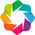

In [227]:
import networkx as nx
from holoviews import opts
import holoviews as hv
hv.extension('bokeh')

defaults = dict(width=400, height=400)
hv.opts.defaults(
    opts.EdgePaths(**defaults), opts.Graph(**defaults), opts.Nodes(**defaults))

In [228]:
kwargs = dict(width=800, height=800, xaxis=None, yaxis=None)
opts.defaults(opts.Nodes(**kwargs), opts.Graph(**kwargs))

In [229]:
gg = hv.Graph.from_networkx(G, nx.layout.circular_layout).opts(tools=['hover'])
gg

:Graph   [start,end]

In [230]:
from holoviews.operation.datashader import bundle_graph
bundled = bundle_graph(gg)
bundled

:Graph   [start,end]

In [231]:
from holoviews.operation.datashader import datashade
(datashade(bundled, normalization='linear', width=800, height=800) * bundled.nodes).opts(
    opts.Nodes(color='circle', size=10, width=1000, legend_position='right'))

:DynamicMap   []
   :Overlay
      .RGB.I   :RGB   [x,y]   (R,G,B,A)
      .Nodes.I :Nodes   [x,y,index]   (label,layer,name)

In [232]:
datashade(bundle_graph(gg), normalization='linear', width=800, height=800) *\
bundled.select(circle='circle15').opts(node_fill_color='white')

:DynamicMap   []
   :Overlay
      .RGB.I   :RGB   [x,y]   (R,G,B,A)
      .Graph.I :Graph   [start,end]